In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px



import warnings 
warnings.filterwarnings('ignore')

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactive = 'all'

In [2]:
data_1  = pd.read_csv(r"C:\Users\SRIKANTH ADIPIREDDY\Downloads\QVI_purchase_behaviour.csv")
data_2 = pd.read_excel(r"C:\Users\SRIKANTH ADIPIREDDY\Downloads\QVI_transaction_data.xlsx")

In [3]:
data_1.head()

,LYLTY_CARD_NBR,LIFESTAGE,PREMIUM_CUSTOMER
0,1000,YOUNG SINGLES/COUPLES,Premium
1,1002,YOUNG SINGLES/COUPLES,Mainstream
2,1003,YOUNG FAMILIES,Budget
3,1004,OLDER SINGLES/COUPLES,Mainstream
4,1005,MIDAGE SINGLES/COUPLES,Mainstream


In [4]:
data_2.head()


,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
0,43390,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0
1,43599,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3
2,43605,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9
3,43329,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0
4,43330,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8


## <a id='toc1_1_'></a>[Merging the data sets](#toc0_)

In [5]:
df= pd.merge(data_1,data_2, on="LYLTY_CARD_NBR", how="left")
df.head()

,LYLTY_CARD_NBR,LIFESTAGE,PREMIUM_CUSTOMER,DATE,STORE_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
0,1000,YOUNG SINGLES/COUPLES,Premium,43390,1,1,5,Natural Chip Compny SeaSalt175g,2,6.0
1,1002,YOUNG SINGLES/COUPLES,Mainstream,43359,1,2,58,Red Rock Deli Chikn&Garlic Aioli 150g,1,2.7
2,1003,YOUNG FAMILIES,Budget,43531,1,3,52,Grain Waves Sour Cream&Chives 210G,1,3.6
3,1003,YOUNG FAMILIES,Budget,43532,1,4,106,Natural ChipCo Hony Soy Chckn175g,1,3.0
4,1004,OLDER SINGLES/COUPLES,Mainstream,43406,1,5,96,WW Original Stacked Chips 160g,1,1.9


## <a id='toc1_2_'></a>[EXPLORATORY DATA ANALYSIS](#toc0_)

In [6]:
# Rename columns to became meaningful
df = df.rename(columns={"LYLTY_CARD_NBR" : "Card No.",
                        "LIFESTAGE" : "Group",
                        "DATE" : "Date",
                        "PREMIUM_CUSTOMER" : "Subscription",
                        "STORE_NBR" : "Store Id",
                        "TXN_ID" : "Transaction Id",
                        "PROD_NBR" : "Product Id",
                        "PROD_NAME" : "Product",
                        "PROD_QTY" : "Quantity",
                        "TOT_SALES" : "Sales",
                        })
df.head()

,Card No.,Group,Subscription,Date,Store Id,Transaction Id,Product Id,Product,Quantity,Sales
0,1000,YOUNG SINGLES/COUPLES,Premium,43390,1,1,5,Natural Chip Compny SeaSalt175g,2,6.0
1,1002,YOUNG SINGLES/COUPLES,Mainstream,43359,1,2,58,Red Rock Deli Chikn&Garlic Aioli 150g,1,2.7
2,1003,YOUNG FAMILIES,Budget,43531,1,3,52,Grain Waves Sour Cream&Chives 210G,1,3.6
3,1003,YOUNG FAMILIES,Budget,43532,1,4,106,Natural ChipCo Hony Soy Chckn175g,1,3.0
4,1004,OLDER SINGLES/COUPLES,Mainstream,43406,1,5,96,WW Original Stacked Chips 160g,1,1.9


### <a id='toc1_2_1_'></a>[EXAMIN THE DATA TYPES IN THE DATA SET](#toc0_)

In [7]:
df.dtypes

Card No.            int64
Group              object
Subscription       object
Date                int64
Store Id            int64
Transaction Id      int64
Product Id          int64
Product            object
Quantity            int64
Sales             float64
dtype: object

### <a id='toc1_2_2_'></a>[CONVERT DATA DATATYPE FROM (int to Date)](#toc0_)

In [8]:
date_offsets = df["Date"].to_list()

In [9]:
base_date = pd.Timestamp("1899-12-30") # Start Date

In [10]:
df["Date"] = [base_date + pd.DateOffset(date_offset) for date_offset in date_offsets]


In [11]:
df["Date"][0:15]

0    2018-10-17
1    2018-09-16
2    2019-03-07
3    2019-03-08
4    2018-11-02
5    2018-12-28
6    2018-12-04
7    2018-12-05
8    2018-11-20
9    2018-09-09
10   2018-12-14
11   2018-07-29
12   2018-11-08
13   2018-12-01
14   2018-12-19
Name: Date, dtype: datetime64[ns]

#### <a id='toc1_2_2_1_'></a>[Variables or Columns  in the dataset](#toc0_)

In [12]:
df.columns

Index(['Card No.', 'Group', 'Subscription', 'Date', 'Store Id',
       'Transaction Id', 'Product Id', 'Product', 'Quantity', 'Sales'],
      dtype='object')

In [13]:
df.Product.unique()

array(['Natural Chip        Compny SeaSalt175g',
       'Red Rock Deli Chikn&Garlic Aioli 150g',
       'Grain Waves Sour    Cream&Chives 210G',
       'Natural ChipCo      Hony Soy Chckn175g',
       'WW Original Stacked Chips 160g', 'Cheetos Puffs 165g',
       'Infuzions SourCream&Herbs Veg Strws 110g',
       'RRD SR Slow Rst     Pork Belly 150g',
       'Doritos Cheese      Supreme 330g', 'Doritos Mexicana    170g',
       'Old El Paso Salsa   Dip Tomato Med 300g',
       'GrnWves Plus Btroot & Chilli Jam 180g',
       'Smiths Crinkle Cut  Chips Barbecue 170g',
       'Kettle Sensations   Camembert & Fig 150g',
       'Doritos Corn Chip Southern Chicken 150g',
       'CCs Tasty Cheese    175g', 'Tostitos Splash Of  Lime 175g',
       'Kettle 135g Swt Pot Sea Salt', 'RRD Salt & Vinegar  165g',
       'Infuzions Mango     Chutny Papadums 70g',
       'Smiths Crinkle Cut  Snag&Sauce 150g',
       'Smiths Crinkle      Original 330g',
       'RRD Sweet Chilli &  Sour Cream 165g',
     

In [14]:
# Remove numbers & special characters
split_prods = df["Product"].str.replace(r"([0-9]+[gG])", "").str.replace(r"[^\w]", " ").str.split()

In [15]:
split_prods

0                     [Natural, Chip, Compny, SeaSalt175g]
1             [Red, Rock, Deli, Chikn&Garlic, Aioli, 150g]
2                 [Grain, Waves, Sour, Cream&Chives, 210G]
3                  [Natural, ChipCo, Hony, Soy, Chckn175g]
4                     [WW, Original, Stacked, Chips, 160g]
                                ...                       
264831                 [Grain, Waves, Sweet, Chilli, 210g]
264832           [Kettle, Tortilla, ChpsFeta&Garlic, 150g]
264833           [Tyrrells, Crisps, Lightly, Salted, 165g]
264834     [Old, El, Paso, Salsa, Dip, Chnky, Tom, Ht300g]
264835    [Smiths, Crinkle, Chips, Salt, &, Vinegar, 330g]
Name: Product, Length: 264836, dtype: object

In [16]:
split_prods.value_counts()

Product
[Kettle, Mozzarella, Basil, &, Pesto, 175g]        3304
[Kettle, Tortilla, ChpsHny&Jlpno, Chili, 150g]     3296
[Cobs, Popd, Swt/Chlli, &Sr/Cream, Chips, 110g]    3269
[Tyrrells, Crisps, Ched, &, Chives, 165g]          3268
[Cobs, Popd, Sea, Salt, Chips, 110g]               3265
                                                   ... 
[RRD, Pc, Sea, Salt, 165g]                         1431
[Woolworths, Medium, Salsa, 300g]                  1430
[NCC, Sour, Cream, &, Garden, Chives, 175g]        1419
[French, Fries, Potato, Chips, 175g]               1418
[WW, Crinkle, Cut, Original, 175g]                 1410
Name: count, Length: 114, dtype: int64

In [17]:
word_counts = {}
def count_words(line) :
    for word in line :
        if word not in word_counts :
            word_counts[word] = 1
        else :
            word_counts[word] += 1


In [18]:
split_prods.apply(lambda line : count_words(line))
print(pd.Series(word_counts).sort_values(ascending=False))

175g       60561
Chips      49770
150g       41633
Kettle     41288
&          35565
           ...  
Whlegrn     1432
Pc          1431
NCC         1419
Garden      1419
Fries       1418
Length: 220, dtype: int64


#### <a id='toc1_2_2_2_'></a>[REMOVE SALSA PRODUCTS](#toc0_)

In [19]:
# df = df[~df["Product"].str.contains(r"[Ss]alsa")]
# df.head()

#### <a id='toc1_2_2_3_'></a>[CHECK NULL & OUTLIERS](#toc0_)

In [20]:
df.describe()
# df

,Card No.,Date,Store Id,Transaction Id,Product Id,Quantity,Sales
count,2.648360e+05,264836,264836.00000,2.648360e+05,264836.000000,264836.000000,264836.000000
mean,1.355495e+05,2018-12-30 00:52:12.879215360,135.08011,1.351583e+05,56.583157,1.907309,7.304200
min,1.000000e+03,2018-07-01 00:00:00,1.00000,1.000000e+00,1.000000,1.000000,1.500000
25%,7.002100e+04,2018-09-30 00:00:00,70.00000,6.760150e+04,28.000000,2.000000,5.400000
50%,1.303575e+05,2018-12-30 00:00:00,130.00000,1.351375e+05,56.000000,2.000000,7.400000
75%,2.030942e+05,2019-03-31 00:00:00,203.00000,2.027012e+05,85.000000,2.000000,9.200000
max,2.373711e+06,2019-06-30 00:00:00,272.00000,2.415841e+06,114.000000,200.000000,650.000000
std,8.057998e+04,NaN,76.78418,7.813303e+04,32.826638,0.643654,3.083226


#### <a id='toc1_2_2_4_'></a>[VIEW OUTLIER CUSTOMER](#toc0_)

In [21]:
df.sort_values(by = "Quantity", ascending = False).head()

,Card No.,Group,Subscription,Date,Store Id,Transaction Id,Product Id,Product,Quantity,Sales
221625,226000,OLDER FAMILIES,Premium,2018-08-19,226,226201,4,Dorito Corn Chp Supreme 380g,200,650.0
221626,226000,OLDER FAMILIES,Premium,2019-05-20,226,226210,4,Dorito Corn Chp Supreme 380g,200,650.0
49316,56063,OLDER FAMILIES,Budget,2019-05-17,56,50363,75,Cobs Popd Sea Salt Chips 110g,5,19.0
32011,36181,RETIREES,Premium,2019-05-15,36,32703,57,Old El Paso Salsa Dip Tomato Mild 300g,5,25.5
8762,9459,YOUNG FAMILIES,Mainstream,2018-08-15,9,8966,42,Doritos Corn Chip Mexican Jalapeno 150g,5,19.5


In [22]:
px.scatter(data_frame= df,x="Card No.",y="Quantity")

#### <a id='toc1_2_2_5_'></a>[SEE IF Card No. 226000 HAS OTHER TRANSACTIONS](#toc0_)

In [23]:
len(df[df["Card No."] == 226000])

2

IT LOOKS LIKE THIS CUSTOMER HAS ONLY HAD THE TWO TRANSACTIONS OVER THE YEAR AND IS NOT AN ORDINARY RETAIL CUSTOMER. THE CUSTOMER MIGHT BE BUYING CHIPS FOR COMMERCIAL PURPOSES INSTEAD. WE WILL REMOVE THIS LOYALTY CARD NUMBER FROM FURTHER ANALYSIS.

In [24]:
df = df[df["Quantity"] < 6]
df.head()

,Card No.,Group,Subscription,Date,Store Id,Transaction Id,Product Id,Product,Quantity,Sales
0,1000,YOUNG SINGLES/COUPLES,Premium,2018-10-17,1,1,5,Natural Chip Compny SeaSalt175g,2,6.0
1,1002,YOUNG SINGLES/COUPLES,Mainstream,2018-09-16,1,2,58,Red Rock Deli Chikn&Garlic Aioli 150g,1,2.7
2,1003,YOUNG FAMILIES,Budget,2019-03-07,1,3,52,Grain Waves Sour Cream&Chives 210G,1,3.6
3,1003,YOUNG FAMILIES,Budget,2019-03-08,1,4,106,Natural ChipCo Hony Soy Chckn175g,1,3.0
4,1004,OLDER SINGLES/COUPLES,Mainstream,2018-11-02,1,5,96,WW Original Stacked Chips 160g,1,1.9


##### <a id='toc1_2_2_5_1_'></a>[COUNT THE NUMBER OF TRANSACTIONS BY DATE](#toc0_)

In [25]:
trans_by_date = df["Date"].value_counts()
trans_by_date

Date
2018-12-24    939
2018-12-23    917
2018-12-22    915
2018-12-19    906
2018-12-18    862
             ... 
2018-12-12    664
2019-06-24    662
2019-06-13    659
2018-10-18    658
2018-11-25    648
Name: count, Length: 364, dtype: int64

##### <a id='toc1_2_2_5_2_'></a>[INSTEAD OF 365, THE DATE COLUMN ONLY HAS 364 UNIQUE VALUES. 1 IS MISSING.](#toc0_)

In [26]:
pd.date_range(start=df["Date"].min(), end=df["Date"].max()).difference(df["Date"])

DatetimeIndex(['2018-12-25'], dtype='datetime64[ns]', freq='D')

In [27]:
## filling the one missing value
merge_value = pd.merge(pd.Series(pd.date_range(start=df["Date"].min(), end=df["Date"].max()), name="Date"), df, on="Date", how="left")
merge_value.head()

,Date,Card No.,Group,Subscription,Store Id,Transaction Id,Product Id,Product,Quantity,Sales
0,2018-07-01,1233.0,YOUNG FAMILIES,Mainstream,1.0,266.0,110.0,WW Original Corn Chips 200g,1.0,1.9
1,2018-07-01,1482.0,YOUNG SINGLES/COUPLES,Mainstream,1.0,563.0,8.0,Smiths Crinkle Cut Chips Original 170g,1.0,2.9
2,2018-07-01,2117.0,OLDER FAMILIES,Mainstream,2.0,712.0,73.0,Smiths Crinkle Cut Salt & Vinegar 170g,1.0,2.9
3,2018-07-01,2283.0,RETIREES,Budget,2.0,895.0,108.0,Kettle Tortilla ChpsHny&Jlpno Chili 150g,2.0,9.2
4,2018-07-01,3054.0,YOUNG FAMILIES,Budget,3.0,1314.0,81.0,Pringles Original Crisps 134g,2.0,7.4


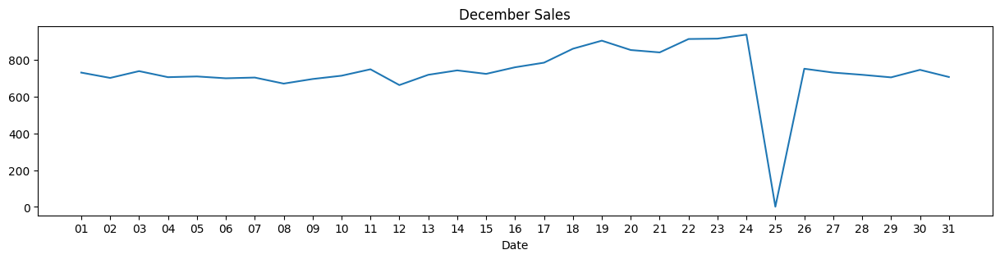

In [28]:
trans_by_date = merge_value["Date"].value_counts()
dec = trans_by_date[(trans_by_date.index >= pd.Timestamp(2018,12,1)) & (trans_by_date.index < pd.Timestamp(2019,1,1))].sort_index()
dec.index = dec.index.strftime('%d')
ax = dec.plot(figsize=(15,3))
ax.set_xticks(np.arange(len(dec)))
ax.set_xticklabels(dec.index)
plt.title("December Sales")
plt.savefig("December Sales.png", bbox_inches="tight")
plt.show()

In [29]:
# Ensure no spaces between the number and "g"/"G" in the regex
df["Product"] = df["Product"].str.replace(r"(\d+)\s*[gG]", r"\1g", regex=True)
# Extract the numeric part before "g" or "G" and convert to float
pack_size = df["Product"].str.extract(r"(\d+)[gG]")[0].astype(float)
print(pack_size)

0         175.0
1         150.0
2         210.0
3         175.0
4         160.0
          ...  
264831    210.0
264832    150.0
264833    165.0
264834    300.0
264835    330.0
Name: 0, Length: 264834, dtype: float64


In [30]:
pack_size.describe()

count    264834.000000
mean        182.425512
std          64.325148
min          70.000000
25%         150.000000
50%         170.000000
75%         175.000000
max         380.000000
Name: 0, dtype: float64

#### <a id='toc1_2_2_6_'></a>[HISTOGRAM SHOWING TRANSACTION FREQUENCY OF PACK SIZE](#toc0_)

In [31]:
px.histogram(data_frame = pack_size,
             nbins=17,
            text_auto= True,
             width=700,
             height=1000,
             title = "TRANSACTION FREQUENCY OF PACK SIZE"
        )

####FREQUENCY OF PRODUCT BRAND NAMES

In [32]:
df.Product.str.split().str[0].value_counts()

Product
Kettle        41288
Smiths        28860
Pringles      25102
Doritos       24962
Thins         14075
RRD           11894
Infuzions     11057
WW            10320
Cobs           9693
Tostitos       9471
Twisties       9454
Old            9324
Tyrrells       6442
Grain          6272
Natural        6050
Red            5885
Cheezels       4603
CCs            4551
Woolworths     4437
Dorito         3183
Infzns         3144
Smith          2963
Cheetos        2927
Snbts          1576
Burger         1564
GrnWves        1468
Sunbites       1432
NCC            1419
French         1418
Name: count, dtype: int64

##### <a id='toc1_2_2_6_1_'></a>[INCLUDE BRAND NAME COLUMN](#toc0_)

In [33]:
df["Brand"] = df.Product.str.split().str[0]
df.head(5)

,Card No.,Group,Subscription,Date,Store Id,Transaction Id,Product Id,Product,Quantity,Sales,Brand
0,1000,YOUNG SINGLES/COUPLES,Premium,2018-10-17,1,1,5,Natural Chip Compny SeaSalt175g,2,6.0,Natural
1,1002,YOUNG SINGLES/COUPLES,Mainstream,2018-09-16,1,2,58,Red Rock Deli Chikn&Garlic Aioli 150g,1,2.7,Red
2,1003,YOUNG FAMILIES,Budget,2019-03-07,1,3,52,Grain Waves Sour Cream&Chives 210g,1,3.6,Grain
3,1003,YOUNG FAMILIES,Budget,2019-03-08,1,4,106,Natural ChipCo Hony Soy Chckn175g,1,3.0,Natural
4,1004,OLDER SINGLES/COUPLES,Mainstream,2018-11-02,1,5,96,WW Original Stacked Chips 160g,1,1.9,WW


In [34]:
def clear_brand_names(line) :
    brand = line["Brand"]
    if brand == "Dorito" :
        return "Doritos"
    elif brand == "GrnWves" or brand == "Grain" :
        return "Grain Waves"
    elif brand == "Infzns" :
        return "Infuzions"
    elif brand == "Natural" or brand == "NCC" :
        return "Natural Chip Co"
    elif brand == "Red" :
        return "RRD"
    elif brand == "Smith" :
        return "Smiths"
    elif brand == "Snbts" :
        return "Sunbites"
    elif brand == "WW" :
        return "Woolworths"
    else :
        return brand

#### <a id='toc1_2_2_7_'></a>[CLEANED TRANSACTIONAL DATA](#toc0_)

In [35]:
df["Brand"] = df.apply(lambda line : clear_brand_names(line), axis=1)
df.head()

,Card No.,Group,Subscription,Date,Store Id,Transaction Id,Product Id,Product,Quantity,Sales,Brand
0,1000,YOUNG SINGLES/COUPLES,Premium,2018-10-17,1,1,5,Natural Chip Compny SeaSalt175g,2,6.0,Natural Chip Co
1,1002,YOUNG SINGLES/COUPLES,Mainstream,2018-09-16,1,2,58,Red Rock Deli Chikn&Garlic Aioli 150g,1,2.7,RRD
2,1003,YOUNG FAMILIES,Budget,2019-03-07,1,3,52,Grain Waves Sour Cream&Chives 210g,1,3.6,Grain Waves
3,1003,YOUNG FAMILIES,Budget,2019-03-08,1,4,106,Natural ChipCo Hony Soy Chckn175g,1,3.0,Natural Chip Co
4,1004,OLDER SINGLES/COUPLES,Mainstream,2018-11-02,1,5,96,WW Original Stacked Chips 160g,1,1.9,Woolworths


In [36]:
brand_counts =df.Brand.value_counts()
fig = px.bar(data_frame=brand_counts,
       text_auto = True,
       width = 1200,
       height = 500,
       title = "HISTOGRAM OF BRAND FREQUENCY",
      )

---> WHO SPENDS THE MOST ON CHIPS (TOTAL SALES), DESCRIBING CUSTOMERS BY LIFESTAGE AND HOW PREMIUM THEIR GENERAL PURCHASING BEHAVIOUR IS ---> HOW MANY CUSTOMERS ARE IN EACH SEGMENT ---> HOW MANY CHIPS ARE BOUGHT PER CUSTOMER BY SEGMENT ---> WHAT IS THE AVERAGE CHIPS PRICE BY CUSTOMER SEGMENT

In [37]:
# 1/ WHO SPENDS THE MOST ON CHIPS (TOTAL SALES), DESCRIBING CUSTOMERS BY LIFESTAGE AND HOW PREMIUM THEIR GENERAL PURCHASING BEHAVIOUR IS
most_shopping = df.groupby(["Group", "Subscription"])["Sales"].agg(["sum"]).sort_values(ascending=False, by="sum")
most_shopping

sum
Group                  Subscription           
OLDER FAMILIES         Budget        168363.25
YOUNG SINGLES/COUPLES  Mainstream    157621.60
RETIREES               Mainstream    155677.05
YOUNG FAMILIES         Budget        139345.85
OLDER SINGLES/COUPLES  Budget        136769.80
                       Mainstream    133393.80
                       Premium       132263.15
RETIREES               Budget        113147.80
OLDER FAMILIES         Mainstream    103445.55
RETIREES               Premium        97646.05
YOUNG FAMILIES         Mainstream     92788.75
MIDAGE SINGLES/COUPLES Mainstream     90803.85
YOUNG FAMILIES         Premium        84025.50
OLDER FAMILIES         Premium        80658.40
YOUNG SINGLES/COUPLES  Budget         61141.60
MIDAGE SINGLES/COUPLES Premium        58432.65
YOUNG SINGLES/COUPLES  Premium        41642.10
MIDAGE SINGLES/COUPLES Budget         35514.80
NEW FAMILIES           Budget         21928.45
                       Mainstream     17013.90
                       Premium        11491.10

#### <a id='toc1_2_2_8_'></a>[HISTOGRAM OF CUSTOMER SEGMENTS CONTRIBUTE TO CHIPS SALES](#toc0_)

In [38]:
 most_shopping_df = most_shopping["sum"].sort_values().reset_index()
fig = px.bar(data_frame = most_shopping_df,
             x="sum",
             y = "Group",
             color ="Subscription",
            width = 1100,
            height = 500,
            text_auto = True)
# most_shopping_df

In [39]:
fig

TOP 3 TOTAL SALES CONTRIBUTOR SEGMENTS ARE - 1/ OLDER FAMILIES (BUDGET) 168.3632k,
YOUNG SINGLES/COUPLES 
547582.20 3/ RETIREES (Mainstream)155.6775

### <a id='toc1_2_3_'></a>[TOP SHOPPING PER GROUP BY SUBSCRITION](#toc0_)

In [40]:
group=df.groupby("Group")["Subscription"].agg(pd.Series.mode).sort_values()
print("==Top contributor per Group by Subscription==")
print(group)

==Top contributor per Group by Subscription==
Group
NEW FAMILIES                  Budget
OLDER FAMILIES                Budget
OLDER SINGLES/COUPLES         Budget
YOUNG FAMILIES                Budget
MIDAGE SINGLES/COUPLES    Mainstream
RETIREES                  Mainstream
YOUNG SINGLES/COUPLES     Mainstream
Name: Subscription, dtype: object


### <a id='toc1_2_4_'></a>[2/ HOW MANY CUSTOMERS ARE IN EACH SEGMENT](#toc0_)


In [41]:
# 2/ HOW MANY CUSTOMERS ARE IN EACH SEGMENT
cust_seg = df.groupby(["Group", "Subscription"])["Card No."].nunique().sort_values(ascending=False)
pd.DataFrame(cust_seg)

Card No.
Group                  Subscription          
YOUNG SINGLES/COUPLES  Mainstream        8088
RETIREES               Mainstream        6479
OLDER SINGLES/COUPLES  Mainstream        4930
                       Budget            4929
                       Premium           4750
OLDER FAMILIES         Budget            4675
RETIREES               Budget            4454
YOUNG FAMILIES         Budget            4017
RETIREES               Premium           3872
YOUNG SINGLES/COUPLES  Budget            3779
MIDAGE SINGLES/COUPLES Mainstream        3340
OLDER FAMILIES         Mainstream        2831
YOUNG FAMILIES         Mainstream        2728
YOUNG SINGLES/COUPLES  Premium           2574
YOUNG FAMILIES         Premium           2433
MIDAGE SINGLES/COUPLES Premium           2431
OLDER FAMILIES         Premium           2273
MIDAGE SINGLES/COUPLES Budget            1504
NEW FAMILIES           Budget            1112
                       Mainstream         849
                       Premium            588

#### <a id='toc1_2_4_1_'></a>[HISTOGRAM OF CUSTOMER SEGMENTS FREQUENCY](#toc0_)

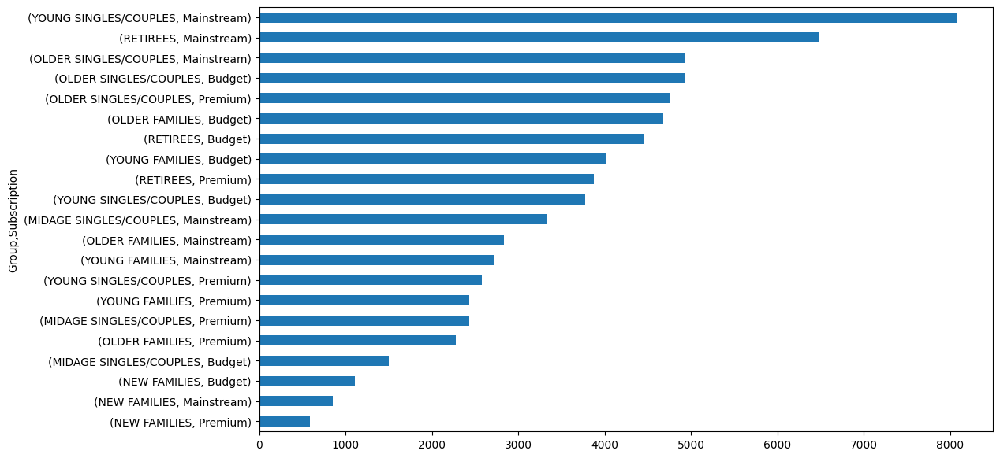

In [42]:
cust_seg.sort_values().plot.barh(figsize = (12, 7))
plt.show()


##### <a id='toc1_2_4_1_1_'></a>[YOUNG SINGLES/COUPLES (Mainstream) HAS THE HIGHEST POPULATION, FOLLOWED BY RETIREES (Mainstream). WHICH EXPLAIN THEIR HIGH TOTAL SALES.](#toc0_)

### <a id='toc1_2_5_'></a>[3/ HOW MANY CHIPS ARE BOUGHT PER CUSTOMER BY SEGMEN](#toc0_)

In [43]:
chips_shop_per_segment = df.groupby(["Card No.", "Group", "Subscription"]).count()["Date"]
chips_shop_per_segment.to_frame()

,,,Date
Card No.,Group,Subscription,
1000,YOUNG SINGLES/COUPLES,Premium,1
1002,YOUNG SINGLES/COUPLES,Mainstream,1
1003,YOUNG FAMILIES,Budget,2
1004,OLDER SINGLES/COUPLES,Mainstream,1
1005,MIDAGE SINGLES/COUPLES,Mainstream,1
...,...,...,...
2370651,MIDAGE SINGLES/COUPLES,Mainstream,1
2370701,YOUNG FAMILIES,Mainstream,1
2370751,YOUNG FAMILIES,Premium,1


In [44]:
# CHIPS SHOPPING FROM GROUPS BY INDIVIDUAL (AVG)
segment_shop_chips = chips_shop_per_segment.groupby(["Group", "Subscription"]).agg(["mean"]).sort_values(ascending=False, by="mean")
segment_shop_chips

mean
Group                  Subscription          
OLDER FAMILIES         Mainstream    5.031438
                       Budget        4.954011
                       Premium       4.923009
YOUNG FAMILIES         Budget        4.760269
                       Premium       4.752569
                       Mainstream    4.731305
OLDER SINGLES/COUPLES  Premium       3.737684
                       Budget        3.734429
                       Mainstream    3.715619
MIDAGE SINGLES/COUPLES Mainstream    3.555090
RETIREES               Budget        3.412887
                       Premium       3.382231
MIDAGE SINGLES/COUPLES Premium       3.379679
                       Budget        3.337766
RETIREES               Mainstream    3.313166
NEW FAMILIES           Mainstream    2.738516
                       Premium       2.702381
                       Budget        2.702338
YOUNG SINGLES/COUPLES  Mainstream    2.578388
                       Budget        2.445621
                       Premium       2.440171

##### <a id='toc1_2_5_1_1_'></a>[HISTOGRAM OF CHIPS SHOPPING BY SEGMENT](#toc0_)

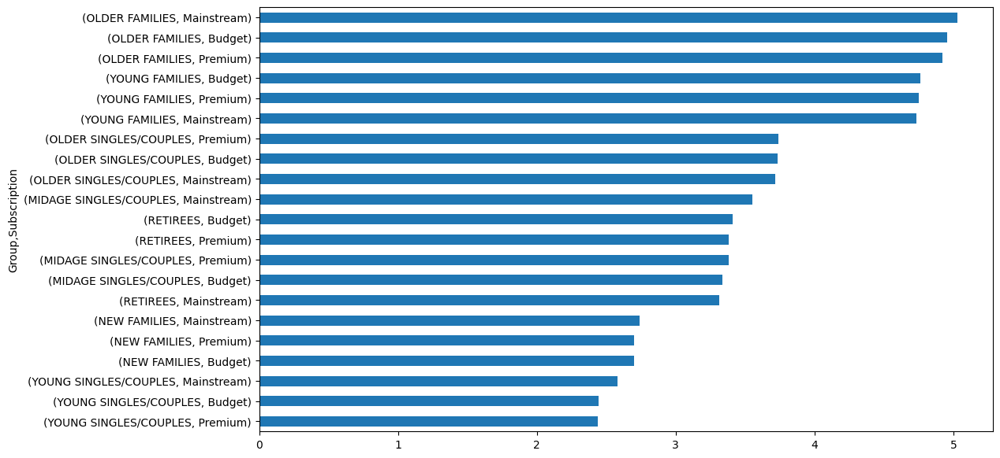

In [45]:
segment_shop_chips['mean'].sort_values().plot.barh(figsize=(12,7))
plt.show()

 ####### 1/ DESPITE OLDER FAMILIES NOT HAVING THE HIGHEST POPULATION, THEY HAVE THE HIGHEST FREQUENCY OF PURCHASE, WHICH CONTRIBUTES TO THEIR HIGH TOTAL SALES. 2/ OLDER FAMILIES FOLLOWED BY YOUNG FAMILIES HAS THE HIGHEST AVERAGE QUANTITY OF CHIPS BOUGHT PER PURCHASE.

In [46]:
# 4/ WHAT IS THE AVERAGE CHIPS PRICE BY CUSTOMER SEGMENT

avg_chips_price_cust_segment = df.groupby(["Group", "Subscription"])["Sales"].agg(["mean"]).sort_values(ascending=False, by="mean")
avg_chips_price_cust_segment

mean
Group                  Subscription          
MIDAGE SINGLES/COUPLES Mainstream    7.647284
YOUNG SINGLES/COUPLES  Mainstream    7.558339
RETIREES               Premium       7.456174
OLDER SINGLES/COUPLES  Premium       7.449766
RETIREES               Budget        7.443445
OLDER SINGLES/COUPLES  Budget        7.430315
NEW FAMILIES           Mainstream    7.317806
                       Budget        7.297321
YOUNG FAMILIES         Budget        7.287201
OLDER SINGLES/COUPLES  Mainstream    7.282116
OLDER FAMILIES         Budget        7.269570
YOUNG FAMILIES         Premium       7.266756
OLDER FAMILIES         Mainstream    7.262395
RETIREES               Mainstream    7.252262
NEW FAMILIES           Premium       7.231655
OLDER FAMILIES         Premium       7.208079
YOUNG FAMILIES         Mainstream    7.189025
MIDAGE SINGLES/COUPLES Premium       7.112056
                       Budget        7.074661
YOUNG SINGLES/COUPLES  Premium       6.629852
                       Budget        6.615624

<Axes: ylabel='Group,Subscription'>

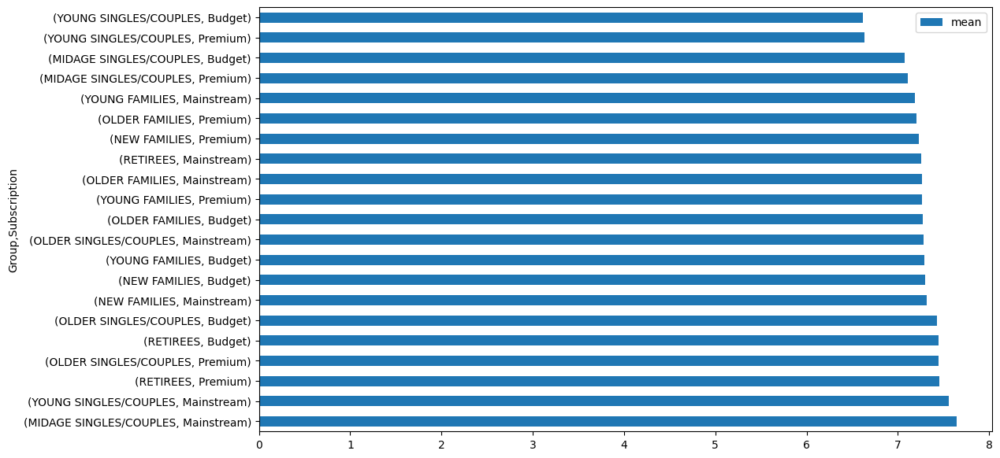

In [47]:
avg_chips_price_cust_segment.plot.barh(figsize = (12, 7))

##### <a id='toc1_2_5_1_2_'></a>[THE Mainstream CATEGORY OF THE "YOUNG & MIDAGE SINGLES/COUPLES" HAVE THE HIGHEST SPENDING OF CHIPS PER PURCHASE. AND THE DIFFERENCE TO THE non-Mainstream "YOUNG & MIDAGE SINGLES/COUPLES" ARE STATISTICALLY SIGNIFICANT.](#toc0_)

#### <a id='toc1_2_5_2_'></a>[EXAMINE WHAT BRAND OF CHIPS THE TOP 3 SEGMENTS CONTRIBUTING TO TOTAL SALES ARE BUYING.](#toc0_)

In [48]:
df.groupby(["Group", "Subscription"])["Brand"].agg(pd.Series.mode).sort_values().to_frame()


Brand
Group                  Subscription        
MIDAGE SINGLES/COUPLES Budget        Kettle
YOUNG FAMILIES         Premium       Kettle
                       Mainstream    Kettle
                       Budget        Kettle
RETIREES               Premium       Kettle
                       Mainstream    Kettle
                       Budget        Kettle
OLDER SINGLES/COUPLES  Premium       Kettle
YOUNG SINGLES/COUPLES  Mainstream    Kettle
OLDER SINGLES/COUPLES  Mainstream    Kettle
OLDER FAMILIES         Mainstream    Kettle
                       Budget        Kettle
NEW FAMILIES           Premium       Kettle
                       Mainstream    Kettle
                       Budget        Kettle
MIDAGE SINGLES/COUPLES Premium       Kettle
                       Mainstream    Kettle
OLDER SINGLES/COUPLES  Budget        Kettle
YOUNG SINGLES/COUPLES  Premium       Kettle
OLDER FAMILIES         Premium       Smiths
YOUNG SINGLES/COUPLES  Budget        Smiths

In [49]:
for stage in df["Group"].unique() :
    for subs in df["Subscription"].unique() :
        print("==========", stage, "-", subs, "==========")
        summary = df[(df["Group"] == stage) & (df["Subscription"] == subs)]["Brand"].value_counts().head(3).to_frame("count").reset_index()
        print(summary)
        # plt.figure
        fig = px.bar(
            data_frame=summary,x="count",y="Brand",
            orientation='h',
            title=f"{stage} - {subs} Top Brands",)
        # summary.plot.barh(figsize = (5, 1))
        # plt.show()
        fig.show()

========== YOUNG SINGLES/COUPLES - Premium ==========
     Brand  count
0   Kettle    838
1   Smiths    826
2  Doritos    570


========== YOUNG SINGLES/COUPLES - Mainstream ==========
      Brand  count
0    Kettle   3844
1   Doritos   2541
2  Pringles   2315


========== YOUNG SINGLES/COUPLES - Budget ==========
     Brand  count
0   Smiths   1245
1   Kettle   1211
2  Doritos    899


========== YOUNG FAMILIES - Premium ==========
     Brand  count
0   Kettle   1745
1   Smiths   1442
2  Doritos   1129


========== YOUNG FAMILIES - Mainstream ==========
     Brand  count
0   Kettle   1789
1   Smiths   1772
2  Doritos   1309


========== YOUNG FAMILIES - Budget ==========
     Brand  count
0   Kettle   2743
1   Smiths   2459
2  Doritos   1996


========== OLDER SINGLES/COUPLES - Premium ==========
     Brand  count
0   Kettle   2947
1   Smiths   2042
2  Doritos   1958


========== OLDER SINGLES/COUPLES - Mainstream ==========
     Brand  count
0   Kettle   2835
1   Smiths   2180
2  Doritos   2008


========== OLDER SINGLES/COUPLES - Budget ==========
     Brand  count
0   Kettle   3065
1   Smiths   2098
2  Doritos   1954


========== MIDAGE SINGLES/COUPLES - Premium ==========
     Brand  count
0   Kettle   1206
1   Smiths    986
2  Doritos    837


========== MIDAGE SINGLES/COUPLES - Mainstream ==========
     Brand  count
0   Kettle   2136
1   Smiths   1337
2  Doritos   1291


========== MIDAGE SINGLES/COUPLES - Budget ==========
     Brand  count
0   Kettle    713
1   Smiths    633
2  Doritos    533


========== NEW FAMILIES - Premium ==========
      Brand  count
0    Kettle    247
1   Doritos    167
2  Pringles    165


========== NEW FAMILIES - Mainstream ==========
     Brand  count
0   Kettle    414
1  Doritos    274
2   Smiths    254


========== NEW FAMILIES - Budget ==========
     Brand  count
0   Kettle    510
1  Doritos    343
2   Smiths    341


========== OLDER FAMILIES - Premium ==========
     Brand  count
0   Smiths   1515
1   Kettle   1512
2  Doritos   1065


========== OLDER FAMILIES - Mainstream ==========
     Brand  count
0   Kettle   2019
1   Smiths   1835
2  Doritos   1449


========== OLDER FAMILIES - Budget ==========
     Brand  count
0   Kettle   3320
1   Smiths   3093
2  Doritos   2351


========== RETIREES - Premium ==========
     Brand  count
0   Kettle   2216
1   Smiths   1458
2  Doritos   1409


========== RETIREES - Mainstream ==========
     Brand  count
0   Kettle   3386
1   Smiths   2476
2  Doritos   2320


========== RETIREES - Budget ==========
     Brand  count
0   Kettle   2592
1  Doritos   1742
2   Smiths   1679


###### <a id='toc1_2_5_2_1_1_'></a>[EVERY SEGMENT HAD "Kettle" AS THE MOST PURCHASED BRAND. EVERY SEGMENT EXCEPT "YOUNG SINGLES/COUPLES Mainstream" HAD "Smiths" AS THEIR SECOND MOST PURCHASED BRAND. "YOUNG SINGLES/COUPLES Mainstream" HAD "Doritos" AS AS THEIR SECOND MOST PURCHASED BRAND](#toc0_)

In [50]:
# MERGE DF WITH PACK SIZE
merged_pack = pd.concat([df, pack_size.rename("Size")], axis=1)
merged_pack.head()

,Card No.,Group,Subscription,Date,Store Id,Transaction Id,Product Id,Product,Quantity,Sales,Brand,Size
0,1000,YOUNG SINGLES/COUPLES,Premium,2018-10-17,1,1,5,Natural Chip Compny SeaSalt175g,2,6.0,Natural Chip Co,175.0
1,1002,YOUNG SINGLES/COUPLES,Mainstream,2018-09-16,1,2,58,Red Rock Deli Chikn&Garlic Aioli 150g,1,2.7,RRD,150.0
2,1003,YOUNG FAMILIES,Budget,2019-03-07,1,3,52,Grain Waves Sour Cream&Chives 210g,1,3.6,Grain Waves,210.0
3,1003,YOUNG FAMILIES,Budget,2019-03-08,1,4,106,Natural ChipCo Hony Soy Chckn175g,1,3.0,Natural Chip Co,175.0
4,1004,OLDER SINGLES/COUPLES,Mainstream,2018-11-02,1,5,96,WW Original Stacked Chips 160g,1,1.9,Woolworths,160.0


In [52]:
for stage in merged_pack["Group"].unique() :
    for subs in merged_pack["Subscription"].unique() :
        print("==========", stage, "-", subs, "==========")
        summary = merged_pack[(merged_pack["Group"] == stage) & (merged_pack["Subscription"] == subs)]["Size"].value_counts().head(3).sort_index().to_frame().reset_index()
        print(summary)
        plt.figure()
        fig = px.bar(
            data_frame=summary,
            x='count',
            y='Size',
            orientation='h')
        # summary.plot.barh(figsize = (5, 1))
        fig.show()

========== YOUNG SINGLES/COUPLES - Premium ==========
    Size  count
0  134.0    537
1  150.0    998
2  175.0   1618


========== YOUNG SINGLES/COUPLES - Mainstream ==========
    Size  count
0  134.0   2315
1  150.0   3241
2  175.0   4997


========== YOUNG SINGLES/COUPLES - Budget ==========
    Size  count
0  134.0    832
1  150.0   1504
2  175.0   2338


========== YOUNG FAMILIES - Premium ==========
    Size  count
0  134.0   1007
1  150.0   1913
2  175.0   2998


========== YOUNG FAMILIES - Mainstream ==========
    Size  count
0  134.0   1148
1  150.0   2178
2  175.0   3174


========== YOUNG FAMILIES - Budget ==========
    Size  count
0  134.0   1674
1  150.0   3094
2  175.0   4921


========== OLDER SINGLES/COUPLES - Premium ==========
    Size  count
0  134.0   1744
1  150.0   2950
2  175.0   4458


========== OLDER SINGLES/COUPLES - Mainstream ==========
    Size  count
0  134.0   1720
1  150.0   2988
2  175.0   4525


========== OLDER SINGLES/COUPLES - Budget ==========
    Size  count
0  134.0   1843
1  150.0   2984
2  175.0   4625


========== MIDAGE SINGLES/COUPLES - Premium ==========
    Size  count
0  134.0    781
1  150.0   1329
2  175.0   2082


========== MIDAGE SINGLES/COUPLES - Mainstream ==========
    Size  count
0  134.0   1159
1  150.0   1882
2  175.0   2975


========== MIDAGE SINGLES/COUPLES - Budget ==========
    Size  count
0  134.0    449
1  150.0    846
2  175.0   1277


========== NEW FAMILIES - Premium ==========
    Size  count
0  134.0    165
1  150.0    253
2  175.0    376


========== NEW FAMILIES - Mainstream ==========
    Size  count
0  134.0    224
1  150.0    396
2  175.0    589


========== NEW FAMILIES - Budget ==========
    Size  count
0  134.0    309
1  150.0    463
2  175.0    777


========== OLDER FAMILIES - Premium ==========
    Size  count
0  134.0   1014
1  150.0   1816
2  175.0   2816


========== OLDER FAMILIES - Mainstream ==========
    Size  count
0  134.0   1234
1  150.0   2359
2  175.0   3588


========== OLDER FAMILIES - Budget ==========
    Size  count
0  134.0   1996
1  150.0   3882
2  175.0   5808


========== RETIREES - Premium ==========
    Size  count
0  134.0   1331
1  150.0   2075
2  175.0   3306


========== RETIREES - Mainstream ==========
    Size  count
0  134.0   2103
1  150.0   3522
2  175.0   5295


========== RETIREES - Budget ==========
    Size  count
0  134.0   1517
1  150.0   2458
2  175.0   3847


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

#### <a id='toc1_2_5_3_'></a>[AVERAGE AMOUNT OF CHIPS BOUGHT PER CUSTOMER SEGMENT](#toc0_)

In [54]:
avg_chips = (df.groupby(["Group", "Subscription"])["Quantity"].sum() / df.groupby(["Group", "Subscription"])["Card No."].nunique()).sort_values(ascending=False).to_frame()
avg_chips

0
Group                  Subscription          
OLDER FAMILIES         Mainstream    9.804309
                       Budget        9.639572
                       Premium       9.578091
YOUNG FAMILIES         Budget        9.238486
                       Premium       9.209207
                       Mainstream    9.180352
OLDER SINGLES/COUPLES  Premium       7.154947
                       Budget        7.145466
                       Mainstream    7.098783
MIDAGE SINGLES/COUPLES Mainstream    6.796108
RETIREES               Budget        6.458015
                       Premium       6.426653
MIDAGE SINGLES/COUPLES Premium       6.386672
                       Budget        6.313830
RETIREES               Mainstream    6.253743
NEW FAMILIES           Mainstream    5.087161
                       Premium       5.028912
                       Budget        5.009892
YOUNG SINGLES/COUPLES  Mainstream    4.776459
                       Budget        4.411485
                       Premium       4.402098

#### <a id='toc1_2_5_4_'></a>[HISTOGRAM OF AVERAGE AMOUNT OF CHIPS BOUGHT PER CUSTOMER SEGMENT](#toc0_)

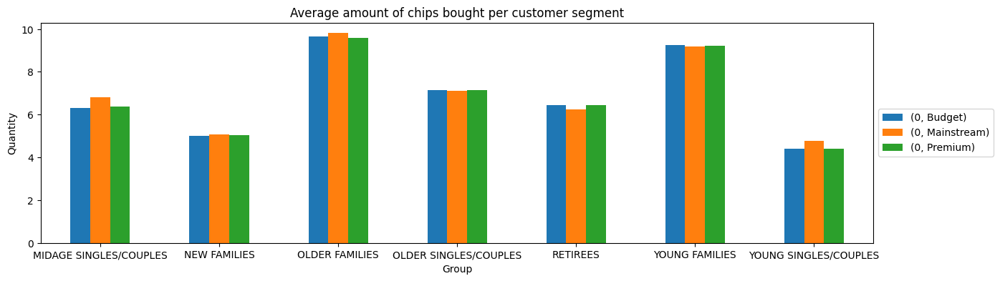

In [55]:
avg_chips.unstack().plot.bar(figsize = (15, 4), rot = 0)
plt.title("Average amount of chips bought per customer segment")
plt.legend(loc = "center left", bbox_to_anchor = (1.0, 0.5))
plt.ylabel("Quantity")
plt.show()

#### <a id='toc1_2_5_5_'></a>[AVERAGE CHIPS PRICE PER TRANSACTION BY SEGMENTS](#toc0_)

In [56]:
# Calculate "Unit Price" only where "Quantity" is non-zero and both columns are not null
df["Unit Price"] = df["Sales"] / df["Quantity"].replace(0, pd.NA)
# Group by "Group" and "Subscription" and calculate the mean of "Unit Price"
chips_segment = df.groupby(["Group", "Subscription"], dropna=False)["Unit Price"].mean().sort_values(ascending=False).to_frame()
# Display the resulting DataFrame
chips_segment

Unit Price
Group                  Subscription            
YOUNG SINGLES/COUPLES  Mainstream      4.071485
MIDAGE SINGLES/COUPLES Mainstream      4.000101
RETIREES               Budget          3.924883
                       Premium         3.921323
NEW FAMILIES           Budget          3.919251
                       Mainstream      3.916581
OLDER SINGLES/COUPLES  Premium         3.887220
                       Budget          3.877022
NEW FAMILIES           Premium         3.871743
RETIREES               Mainstream      3.833343
OLDER SINGLES/COUPLES  Mainstream      3.803800
YOUNG FAMILIES         Budget          3.753659
MIDAGE SINGLES/COUPLES Premium         3.752915
YOUNG FAMILIES         Premium         3.752402
OLDER FAMILIES         Budget          3.733344
MIDAGE SINGLES/COUPLES Budget          3.728496
OLDER FAMILIES         Mainstream      3.727383
YOUNG FAMILIES         Mainstream      3.707097
OLDER FAMILIES         Premium         3.704625
YOUNG SINGLES/COUPLES  Premium         3.645518
                       Budget          3.637681

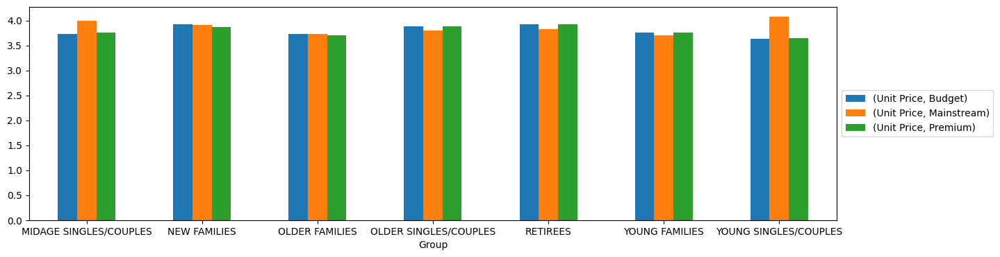

In [57]:
chips_segment.unstack().plot.bar(figsize = (15, 4), rot = 0)
plt.legend(loc = "center left", bbox_to_anchor = (1.0, 0.5))
plt.show()

**Table of contents**<a id='toc0_'></a>    
- [Merging the data sets](#toc1_1_)    
  - [EXPLORATORY DATA ANALYSIS](#toc1_2_)    
    - [EXAMIN THE DATA TYPES IN THE DATA SET](#toc1_2_1_)    
    - [CONVERT DATA DATATYPE FROM (int to Date)](#toc1_2_2_)    
      - [Variables or Columns  in the dataset](#toc1_2_2_1_)    
      - [REMOVE SALSA PRODUCTS](#toc1_2_2_2_)    
      - [CHECK NULL & OUTLIERS](#toc1_2_2_3_)    
      - [VIEW OUTLIER CUSTOMER](#toc1_2_2_4_)    
      - [SEE IF Card No. 226000 HAS OTHER TRANSACTIONS](#toc1_2_2_5_)    
        - [COUNT THE NUMBER OF TRANSACTIONS BY DATE](#toc1_2_2_5_1_)    
        - [INSTEAD OF 365, THE DATE COLUMN ONLY HAS 364 UNIQUE VALUES. 1 IS MISSING.](#toc1_2_2_5_2_)    
      - [HISTOGRAM SHOWING TRANSACTION FREQUENCY OF PACK SIZE](#toc1_2_2_6_)    
        - [INCLUDE BRAND NAME COLUMN](#toc1_2_2_6_1_)    
      - [CLEANED TRANSACTIONAL DATA](#toc1_2_2_7_)    
      - [HISTOGRAM OF CUSTOMER SEGMENTS CONTRIBUTE TO CHIPS SALES](#toc1_2_2_8_)    
    - [TOP SHOPPING PER GROUP BY SUBSCRITION](#toc1_2_3_)    
    - [2/ HOW MANY CUSTOMERS ARE IN EACH SEGMENT](#toc1_2_4_)    
      - [HISTOGRAM OF CUSTOMER SEGMENTS FREQUENCY](#toc1_2_4_1_)    
        - [YOUNG SINGLES/COUPLES (Mainstream) HAS THE HIGHEST POPULATION, FOLLOWED BY RETIREES (Mainstream). WHICH EXPLAIN THEIR HIGH TOTAL SALES.](#toc1_2_4_1_1_)    
    - [3/ HOW MANY CHIPS ARE BOUGHT PER CUSTOMER BY SEGMEN](#toc1_2_5_)    
        - [HISTOGRAM OF CHIPS SHOPPING BY SEGMENT](#toc1_2_5_1_1_)    
        - [THE Mainstream CATEGORY OF THE "YOUNG & MIDAGE SINGLES/COUPLES" HAVE THE HIGHEST SPENDING OF CHIPS PER PURCHASE. AND THE DIFFERENCE TO THE non-Mainstream "YOUNG & MIDAGE SINGLES/COUPLES" ARE STATISTICALLY SIGNIFICANT.](#toc1_2_5_1_2_)    
      - [EXAMINE WHAT BRAND OF CHIPS THE TOP 3 SEGMENTS CONTRIBUTING TO TOTAL SALES ARE BUYING.](#toc1_2_5_2_)    
          - [EVERY SEGMENT HAD "Kettle" AS THE MOST PURCHASED BRAND. EVERY SEGMENT EXCEPT "YOUNG SINGLES/COUPLES Mainstream" HAD "Smiths" AS THEIR SECOND MOST PURCHASED BRAND. "YOUNG SINGLES/COUPLES Mainstream" HAD "Doritos" AS AS THEIR SECOND MOST PURCHASED BRAND](#toc1_2_5_2_1_1_)    
      - [AVERAGE AMOUNT OF CHIPS BOUGHT PER CUSTOMER SEGMENT](#toc1_2_5_3_)    
      - [HISTOGRAM OF AVERAGE AMOUNT OF CHIPS BOUGHT PER CUSTOMER SEGMENT](#toc1_2_5_4_)    
      - [AVERAGE CHIPS PRICE PER TRANSACTION BY SEGMENTS](#toc1_2_5_5_)    

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

RECOMMENDATIONS

1/ OLDER FAMILIES - Focus on the Budget Segment. - Strength: Frequent Purchase. We can give promotions that encourages more frequency of purchase. - Strength: High quantity of chips are purchased per visit. We can give promotions that encourage them to buy more quantity of chips per purchase.

2/ YOUNG SINGLES/COUPLES - Focus on the Mainstream Segment. - This segment is the only segment that had "Doritos" as their 2nd most purchased brand (after "Kettle"). To specifically target this segment it might be a good idea to collaborate with "Doritos" merchant to do some branding promotion catered to "YOUNG SINGLES/COUPLES Mainstream" segment. - Strength: Population quantity. We can spend more effort on making sure our promotions reach them, and it reaches them frequently.

3/ RETIREES - Focus on the Mainstream Segment. - Strength: Population quantity. Again, since their population quantity is the contributor to the high total sales, we should spend more effort on making sure our promotions reaches as many of them as possible and frequent.

4/ GENERAL - All segments has "Kettle" as the most frequently purchased brand, and 175g (regardless of brand) followed by 150g as the preferred chips size. - When promoting chips in general to all segments it is good to take advantage of these two points.

In [1]:
! brew install pandoc

'brew' is not recognized as an internal or external command,
operable program or batch file.


In [3]:
! pip install pandoc